In [1]:
from IPython.display import Image

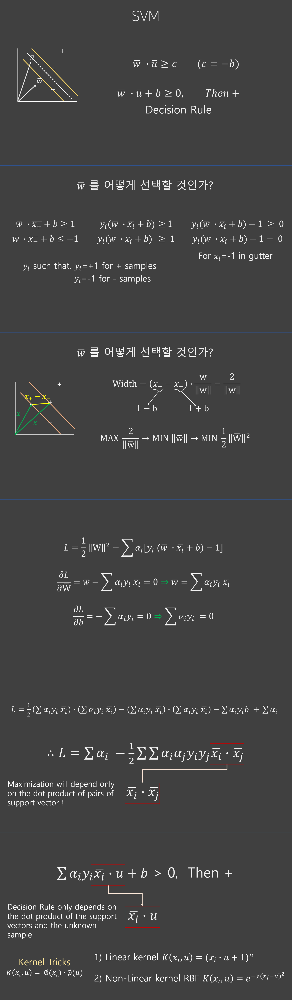

In [2]:
Image(filename='D:/bigdata/Python/pictures/SVM.png')

# How is SVM different from Logit?

Logit은 각각의 데이터 포인트들을 기준으로 Decision boundary와의 거리 or 오차를 계산하고, SVM은 0/1 그룹으로 나뉜 데이터, “그룹”을 기준으로 Decision boundary와의 거리를 계산한다. SVM이 수학적으로 더 Elegant한 부분이 많지만, Outlier들에 굉장히 취약할 수 밖에 없는 구조이다

일반적인 SVM은 support vector 이외의 값은 무시하며, 기본적으로 hinge loss는 logistic loss보다 less sensitive인데 
SVM이 logistic regression에 비해 outlier에 취약하다고 볼 수 있는가?

그 outlier가 support vector를 정의하게 된다면?

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from mlxtend.plotting import plot_decision_regions
from sklearn.datasets.samples_generator import make_circles
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
import tensorflow as tf

In [4]:
def plot_decision_boundary(X,y, Predict):
    # Set min and max values and give it some padding
    N,D=X.shape
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    h = 0.05
    # Generate a grid of points with distance h between them
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    # Predict the function value for the whole gid
    Z=np.zeros(xx.shape[0]*xx.shape[1])
    
    for i in range(xx.shape[0]*xx.shape[1]//N):
        Z[N*i:N*(i+1)]+= Predict(np.c_[xx.ravel(), yy.ravel()][N*i:N*(i+1)])
    for j in range(xx.shape[0]*xx.shape[1]%N):
        Z[N*(i+1)+j : N*(i+1)+j+1]+= Predict(np.c_[xx.ravel(), yy.ravel()][N*(i+1)+j : N*(i+1)+j+1].reshape(1,D))

    Z = Z.reshape(xx.shape)
    
    # Plot the contour and training examples
    plt.contourf(xx, yy, Z, cmap=plt.cm.Spectral)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Spectral)

In [5]:
class NN():
    def __init__(self, X, y, y_classes, svm=False):
        _, D=X.shape
        self.X=tf.placeholder(tf.float32, shape=[None, D])
        self.Y = tf.placeholder(tf.int32, shape=[None])
        self.nb_classes = y_classes
        self.svm=svm
        self.loss(1e-2)
        self.train(X,y)
        
    def loss(self, lr):
        L1=tf.layers.dense(self.X, 64, activation=tf.nn.relu)
        L2=tf.layers.dense(L1, 64, activation=tf.nn.relu)
        L3=tf.layers.dense(L1, 64, activation=tf.nn.relu)
        
        self.outputs=tf.layers.dense(L3, self.nb_classes, activation=tf.nn.softmax)
        
        if self.svm:
            self.loss =tf.losses.hinge_loss(labels=tf.one_hot(self.Y, self.nb_classes), logits=self.outputs)
        else:
            self.loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(self.Y, self.nb_classes), logits=self.outputs)
        self.trains = tf.train.AdamOptimizer(learning_rate=lr).minimize(self.loss)
        self.sess = tf.Session()
        self.sess.run(tf.global_variables_initializer())
        
    def Predict(self, x):
        out = self.sess.run(self.outputs, feed_dict={self.X: x})
        out=tf.argmax(out, axis=1)
        return self.sess.run(out)
    
    def train(self, X, y):
        for _ in range(100):
            c, _ = self.sess.run([self.loss, self.trains],
                             feed_dict={self.X: X, self.Y:y})


In [6]:
def relu(x):
    return np.maximum(0,x)

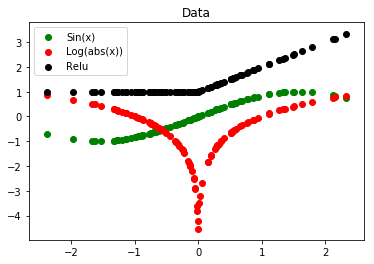

In [7]:
#Creating Data
n=100
Data=np.random.normal(size=(n,))
y_sin=np.sin(Data)
y_log=np.log(abs(Data)+1e-2)
y_relu=relu(Data)+1
X_data=np.zeros((3*n,2))
y_label=np.zeros((3*n,))
y_label=y_label.astype(int)
for i in range(n):
    X_data[i]+=np.array([Data[i], y_sin[i]])
for i in range(n,2*n):
    X_data[i]+=np.array([Data[i-n], y_log[i-n]])
    y_label[i]=1
for i in range(2*n,3*n):
    X_data[i]+=np.array([Data[i-2*n], y_relu[i-2*n]])
    y_label[i]=2
plt.figure()
plt.title('Data')
plt.scatter(X_data[:n,0], X_data[:n,1], color='green', label='Sin(x)')
plt.scatter(X_data[n:2*n,0], X_data[n:2*n,1], color='red', label='Log(abs(x))')
plt.scatter(X_data[2*n:,0], X_data[2*n:,1], color='black', label='Relu')
plt.legend(loc='best')
plt.show()

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


C:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


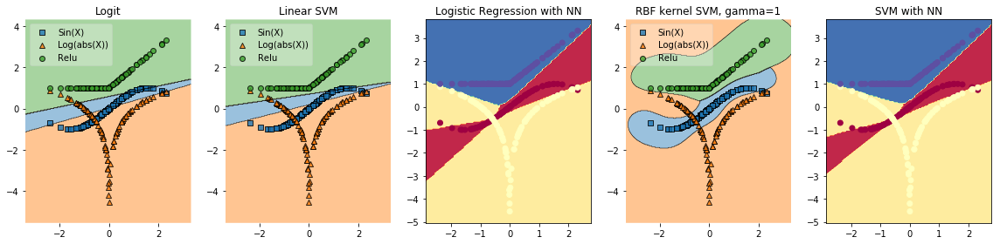

In [8]:
# Initializing Classifiers
clf1 = LogisticRegression(random_state=0)
clf2 = LinearSVC(random_state=0)
clf3 = NN(X_data, y_label, np.max(y_label)+1)
clf4 = SVC(random_state=0, probability=True, gamma=1)
clf5 = NN(X_data, y_label, np.max(y_label)+1, svm=True)

# Plotting Decision Regions
fig = plt.figure(figsize=(16, 4))

for i in range(1, 6):
    ax = plt.subplot(1, 5, i)
    if i == 1:
        clf1.fit(X_data, y_label)
        fig=plot_decision_regions(X=X_data, y=y_label,
                                        clf=clf1)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['Sin(X)', 'Log(abs(X))', 'Relu'], framealpha=0.3, scatterpoints=1)
        ax.set_title('Logit')
    elif i == 2:
        clf2.fit(X_data, y_label)
        fig=plot_decision_regions(X=X_data, y=y_label,
                                        clf=clf2)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['Sin(X)', 'Log(abs(X))', 'Relu'], framealpha=0.3, scatterpoints=1)
        ax.set_title('Linear SVM')
    elif i == 3:
        fig=plot_decision_boundary(X_data,y_label,clf3.Predict)
        ax.set_title("Logistic Regression with NN")
    elif i == 4:
        clf4.fit(X_data, y_label)
        fig=plot_decision_regions(X=X_data, y=y_label,
                                        clf=clf4)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['Sin(X)', 'Log(abs(X))', 'Relu'], framealpha=0.3, scatterpoints=1)
        ax.set_title('RBF kernel SVM, gamma=1')
    elif i == 5:
        fig=plot_decision_boundary(X_data, y_label, clf5.Predict)
        ax.set_title("SVM with NN")
plt.tight_layout()
plt.show()




# Noise

In [9]:
# Adding High noise to Data
noise_index_for_sin=np.random.choice(np.arange(n), 20)               #0
noise_index_for_log=np.random.choice(np.arange(n, 2*n), 20)          #1
noise_index_for_Relu=np.random.choice(np.arange(2*n, 3*n), 20)       #2
y_label[noise_index_for_sin]=1
y_label[noise_index_for_log]=2
y_label[noise_index_for_Relu]=0

C:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


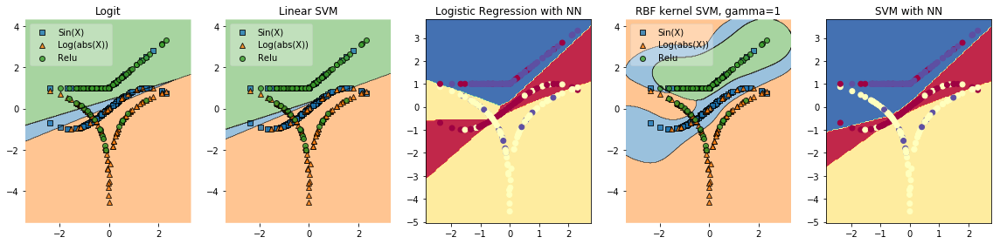

In [10]:
# Initializing Classifiers
clf1 = LogisticRegression(random_state=0)
clf2 = LinearSVC(random_state=0)
clf3 = NN(X_data, y_label, np.max(y_label)+1)
clf4 = SVC(random_state=0, probability=True, gamma=1)
clf5 = NN(X_data, y_label, np.max(y_label)+1, svm=True)

# Plotting Decision Regions
fig = plt.figure(figsize=(16, 4))

for i in range(1, 6):
    ax = plt.subplot(1, 5, i)
    if i == 1:
        clf1.fit(X_data, y_label)
        fig=plot_decision_regions(X=X_data, y=y_label,
                                        clf=clf1)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['Sin(X)', 'Log(abs(X))', 'Relu'], framealpha=0.3, scatterpoints=1)
        ax.set_title('Logit')
    elif i == 2:
        clf2.fit(X_data, y_label)
        fig=plot_decision_regions(X=X_data, y=y_label,
                                        clf=clf2)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['Sin(X)', 'Log(abs(X))', 'Relu'], framealpha=0.3, scatterpoints=1)
        ax.set_title('Linear SVM')
    elif i == 3:
        fig=plot_decision_boundary(X_data,y_label,clf3.Predict)
        ax.set_title("Logistic Regression with NN")
    elif i == 4:
        clf4.fit(X_data, y_label)
        fig=plot_decision_regions(X=X_data, y=y_label,
                                        clf=clf4)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['Sin(X)', 'Log(abs(X))', 'Relu'], framealpha=0.3, scatterpoints=1)
        ax.set_title('RBF kernel SVM, gamma=1')
    elif i == 5:
        fig=plot_decision_boundary(X_data, y_label, clf5.Predict)
        ax.set_title("SVM with NN")
plt.tight_layout()
plt.show()




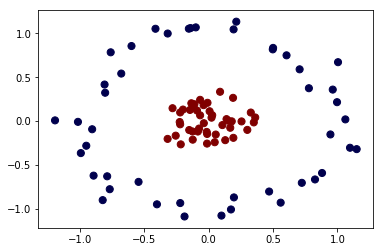

In [11]:
X,y = make_circles(90, factor=0.2, noise=0.1) 
#noise = standard deviation of Gaussian noise added in data. 
#factor = scale factor between the two circles
plt.scatter(X[:,0],X[:,1], c=y, s=50, cmap='seismic')
plt.show()

## RBF Kernel

Traceback (most recent call last):
  File "C:\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py", line 215, in process
    func(*args, **kwargs)
  File "C:\Anaconda3\lib\site-packages\matplotlib\animation.py", line 999, in _start
    self._init_draw()
  File "C:\Anaconda3\lib\site-packages\matplotlib\animation.py", line 1743, in _init_draw
    self._drawn_artists = self._init_func()
  File "<ipython-input-12-e83714fa2c6b>", line 13, in plot3dim
    ax.set_zticklabels(zaxislabel, fontsize=7)
NameError: name 'zaxislabel' is not defined


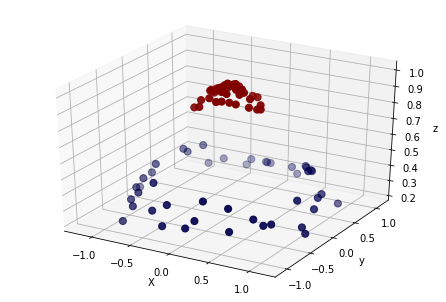

In [12]:
r = np.exp(-(X**2).sum(1))

fig = plt.figure()
ax = Axes3D(fig)

def plot3dim():
    #ax=plt.subplot(111, projection='3d')
    ax.scatter(X[:,0], X[:,1], r, c=y, s=50, cmap='seismic')
    #ax.view_init(elev=elev,azim=azim)
    ax.set_xlabel('X')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_zticklabels(zaxislabel, fontsize=7)
    ax.set_zticks(zaxis)
    ax.grid('False')
    return fig, 

def animate(k):
    ax.view_init(elev=k,azim=30)
    return fig,

ani = animation.FuncAnimation(fig, animate, init_func=plot3dim, frames=360, interval=30, blit=False)


plt.show()

C:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


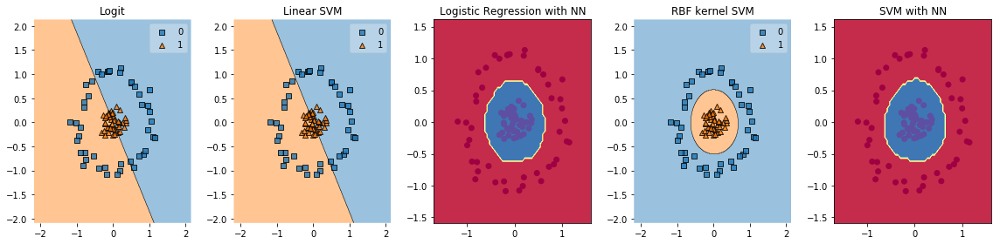

In [13]:
# Initializing Classifiers
clf1 = LogisticRegression(random_state=0)
clf2 = LinearSVC(random_state=0)
clf3 = NN(X, y, np.max(y)+1)
clf4 = SVC(kernel='rbf')
clf5 = NN(X, y, np.max(y)+1, svm=True)

# Plotting Decision Regions
fig = plt.figure(figsize=(16, 4))

for i in range(1, 6):
    ax = plt.subplot(1, 5, i)
    if i == 1:
        clf1.fit(X,y)
        fig=plot_decision_regions(X, y,
                                        clf=clf1)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['0', '1'], framealpha=0.3, scatterpoints=1)
        ax.set_title('Logit')
    elif i == 2:
        clf2.fit(X,y)
        fig=plot_decision_regions(X, y,
                                        clf=clf2)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles,['0', '1'], framealpha=0.3, scatterpoints=1)
        ax.set_title('Linear SVM')
    elif i == 3:
        fig=plot_decision_boundary(X, y, clf3.Predict)
        ax.set_title("Logistic Regression with NN")
    elif i == 4:
        clf4.fit(X,y)
        fig=plot_decision_regions(X, y,
                                        clf=clf4)
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ['0', '1'], framealpha=0.3, scatterpoints=1)
        ax.set_title('RBF kernel SVM')
    elif i == 5:
        fig=plot_decision_boundary(X, y, clf5.Predict)
        ax.set_title("SVM with NN")
        
plt.tight_layout()
plt.show()




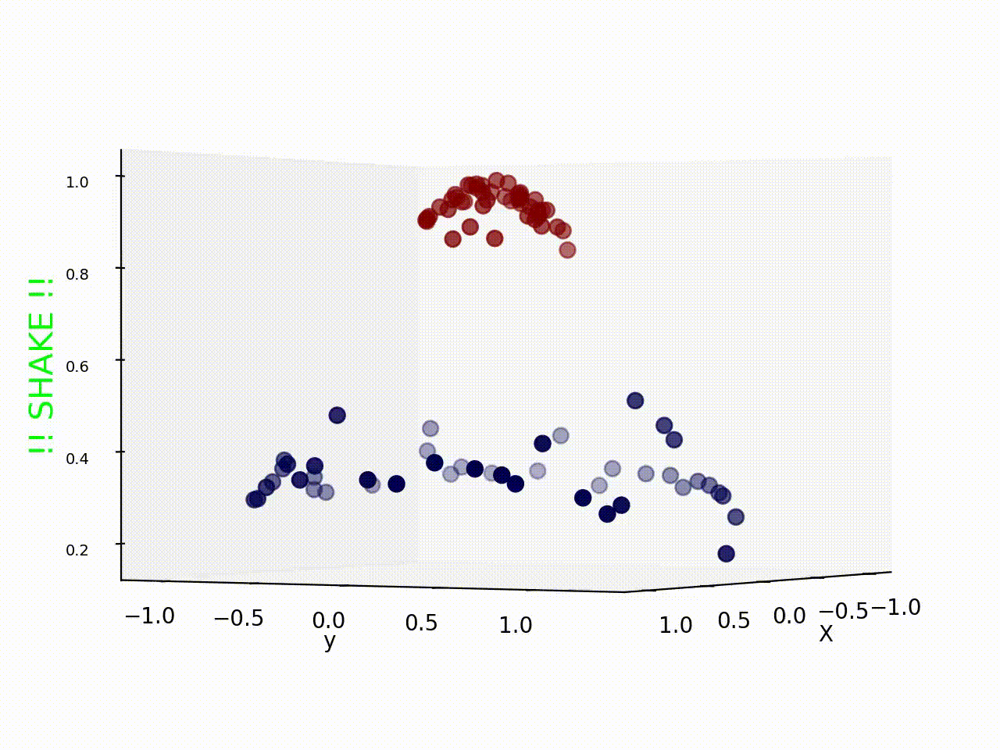

In [14]:
Image(filename='D:/bigdata/Python/pictures/rotating circle.gif')